In [ ]:
import os
import numpy as np
import pandas as pd

import seaborn as sns
import plotly.express as px 
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist

import warnings
warnings.filterwarnings("ignore")

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
data = pd.read_csv("/content/drive/MyDrive/Music Recommender System/KMeanClustering/data.csv")
genre_data = pd.read_csv('/content/drive/MyDrive/Music Recommender System/KMeanClustering/data_by_genres.csv')
year_data = pd.read_csv('/content/drive/MyDrive/Music Recommender System/KMeanClustering/data_by_year.csv')

In [ ]:
#  Phase 1: Data Preperation

In [ ]:
# This table shows the content of datasets of data.csv

data.head(5)

,valence,year,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo
0,0.0594,1921,0.982,"['Sergei Rachmaninoff', 'James Levine', 'Berli...",0.279,831667,0.211,0,4BJqT0PrAfrxzMOxytFOIz,0.878000,10,0.665,-20.096,1,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...",4,1921,0.0366,80.954
1,0.9630,1921,0.732,['Dennis Day'],0.819,180533,0.341,0,7xPhfUan2yNtyFG0cUWkt8,0.000000,7,0.160,-12.441,1,Clancy Lowered the Boom,5,1921,0.4150,60.936
2,0.0394,1921,0.961,['KHP Kridhamardawa Karaton Ngayogyakarta Hadi...,0.328,500062,0.166,0,1o6I8BglA6ylDMrIELygv1,0.913000,3,0.101,-14.850,1,Gati Bali,5,1921,0.0339,110.339
3,0.1650,1921,0.967,['Frank Parker'],0.275,210000,0.309,0,3ftBPsC5vPBKxYSee08FDH,0.000028,5,0.381,-9.316,1,Danny Boy,3,1921,0.0354,100.109
4,0.2530,1921,0.957,['Phil Regan'],0.418,166693,0.193,0,4d6HGyGT8e121BsdKmw9v6,0.000002,3,0.229,-10.096,1,When Irish Eyes Are Smiling,2,1921,0.0380,101.665


In [ ]:
# Remove special character from datasets, make it easier for user to read 

spec_chars = ["!",'"',"#","%","&","'","(",")",
              "*","+",",","-",".","/",":",";","<",
              "=",">","?","@","[","\\","]","^","_",
              "`","{","|","}","~","–"]
for char in spec_chars:
    data['artists'] = data['artists'].str.replace(char, ' ')
    data['name'] = data['name'].str.replace(char, ' ')

In [ ]:
# Phase 2:  Mutual Feature Calculation 

# This visualizer calculates Pearson correlation coefficients and mutual information between features and variables.

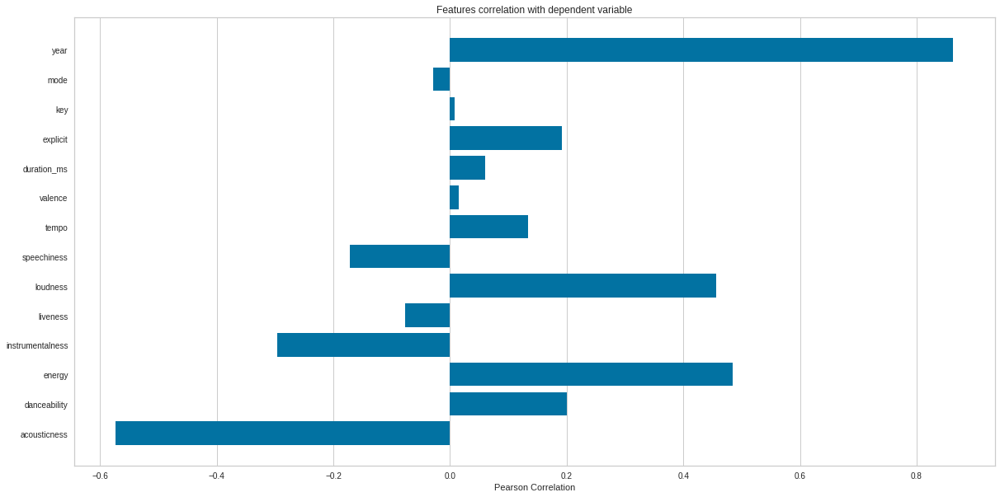

In [ ]:
from yellowbrick.target import FeatureCorrelation

feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence','duration_ms','explicit','key','mode','year']

# In this case, variable of songs’ popularity is used to calculate correlation against other songs’ features. 
X, y = data[feature_names], data['popularity']

# Create a list of the feature names
features = np.array(feature_names)

# Instantiate the visualizer
visualizer = FeatureCorrelation(labels=features)

plt.rcParams['figure.figsize']=(20,10)
visualizer.fit(X, y)     # Fit the data to the visualizer
visualizer.show()

In [ ]:
# Phase 3:  Sound Feature Analyzation

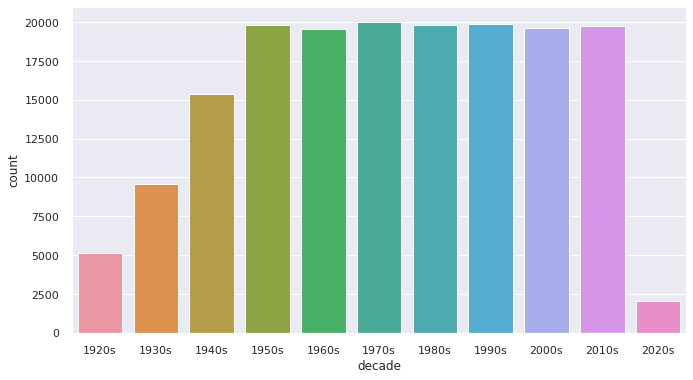

In [ ]:
def get_decade(year):
    period_start = int(year/10) * 10
    decade = '{}s'.format(period_start)
    return decade

data['decade'] = data['year'].apply(get_decade)

# The figure shows the total number of songs released over the years from the 1920s to 2020s
sns.set(rc={'figure.figsize':(11 ,6)})
sns.countplot(x=data['decade'])

In [ ]:
sound_features = ['acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'valence']

# The figure shows  the song features value of songs over the year
fig = px.line(year_data, x='year', y=sound_features)
fig.show()

In [ ]:
# This figure shows the top 10 genre (picked according to popularity) with their value of four most common sound feature. 
top10_genres = genre_data.nlargest(10, 'popularity')

fig = px.bar(top10_genres, x='genres', y=['valence', 'energy', 'danceability', 'acousticness'], barmode='group')
fig.show()

In [ ]:
# Phase 4: Perform K-mean Clustering algorithm 

In [ ]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline

# Divide the dataset into ten clusters based on the number of numerical audio features 
cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=10))])

# Select all nuperic types data of dataset
X = genre_data.select_dtypes(np.number)
cluster_pipeline.fit(X)
genre_data['cluster'] = cluster_pipeline.predict(X)

In [ ]:
from sklearn.manifold import TSNE

# n_components indicates dimension ; perplexity  related to the number of nearest neighbors that is used in the learning algorithms. 
# default number of iterations is 1000
tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1,perplexity=20))])
genre_embedding = tsne_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)

# Plot using genres in datasets
projection['genres'] = genre_data['genres']
projection['cluster'] = genre_data['cluster']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
fig.show()

[t-SNE] Computing 61 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.004s...
[t-SNE] Computed neighbors for 2973 samples in 0.208s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.710514
[t-SNE] KL divergence after 250 iterations with early exaggeration: 79.227325
[t-SNE] KL divergence after 1000 iterations: 1.428903


In [ ]:
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()), 
                                  ('kmeans', KMeans(n_clusters=10, 
                                   verbose=False))
                                 ], verbose=False)

X = data.select_dtypes(np.number)
number_cols = list(X.columns)
song_cluster_pipeline.fit(X)
song_cluster_labels = song_cluster_pipeline.predict(X)
data['cluster_label'] = song_cluster_labels

In [ ]:
from sklearn.decomposition import PCA

pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)

# Plot using song names in datasets
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']

fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()

In [ ]:
# Phase 5: Building Recommendation engine

In [ ]:
!pip install spotipy
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from collections import defaultdict

sp = spotipy.Spotify(auth_manager=SpotifyClientCredentials(client_id="0ee8cb1dce8241c7ba2adc0d46755303",
                                                           client_secret="e000e0866b524408b7ea48b3542ac489"))

def find_song(name):
    song_data = defaultdict()
    results = sp.search(q= 'track: {} year: {}'.format(name,year), limit=1)
    #results = sp.search(q= 'track: {} '.format(name), limit=1)
    if results['tracks']['items'] == []:
        return None

    results = results['tracks']['items'][0]
    track_id = results['id']
    audio_features = sp.audio_features(track_id)[0]

    song_data['name'] = [name]
    song_data['year'] = [year]
    song_data['explicit'] = [int(results['explicit'])]
    song_data['duration_ms'] = [results['duration_ms']]
    song_data['popularity'] = [results['popularity']]

    for key, value in audio_features.items():
        song_data[key] = value

    return pd.DataFrame(song_data)

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from collections import defaultdict
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist
import difflib

number_cols = ['valence', 'year', 'acousticness', 'danceability', 'duration_ms', 'energy', 'explicit',
 'instrumentalness', 'key', 'liveness', 'loudness', 'mode', 'popularity', 'speechiness', 'tempo']

# Function to search for input song in database
def get_song_data(song, spotify_data):
    
    try:
        song_data = spotify_data[(spotify_data['name'] == song['name']) ].iloc[0]
        return song_data
    
    except IndexError:
        return find_song(song['name'])
        
# Function to take the sound feature value of the input song
# Compute the average vector of the audio and metadata features for each song the user has listened to
def get_mean_vector(song_list, spotify_data):
    
    song_vectors = []
    
    for song in song_list:
        song_data = get_song_data(song, spotify_data)
        if song_data is None:
            print('Warning: {} does not exist in Spotify or in database'.format(song['name']))
            continue
        song_vector = song_data[number_cols].values
        song_vectors.append(song_vector)  
    
    song_matrix = np.array(list(song_vectors))
    return np.mean(song_matrix, axis=0)


def flatten_dict_list(dict_list):
    
    flattened_dict = defaultdict()
    for key in dict_list[0].keys():
        flattened_dict[key] = []
    
    for dictionary in dict_list:
        for key, value in dictionary.items():
            flattened_dict[key].append(value)
            
    return flattened_dict


def recommend_songs( song_list, spotify_data, n_songs):
    
    metadata_cols = ['name']
    song_dict = flatten_dict_list(song_list)

# Search for input song from database
    song_center = get_mean_vector(song_list, spotify_data)
    scaler = song_cluster_pipeline.steps[0][1]
    scaled_data = scaler.transform(spotify_data[number_cols])
    scaled_song_center = scaler.transform(song_center.reshape(1, -1))
# Calculate the distance between songs 
    distances = cdist(scaled_song_center, scaled_data, 'cosine')
    index = list(np.argsort(distances)[:, :n_songs+1][0])
    
    rec_songs = spotify_data.iloc[index]
    rec_songs = rec_songs[~rec_songs['name'].isin(song_dict['name'])]
    j =1; 
    
    for i in rec_songs[metadata_cols].to_dict(orient='records'):
        print(j,"-" , i['name'])
        j+=1
    #return rec_songs[metadata_cols].to_dict(orient='records')

In [ ]:
song = input('Please enter The name of the song :')
num = int(input('Please enter the number of recommendations you want: '))

recommend_songs([{'name': song}],  data,num)

Please enter The name of the song :Fearless
Please enter the number of recommendations you want: 20
1 - The Electrician
2 - Praise Looks Good On You   Live
3 - Por Quien Merece Amor
4 - Going Home   Live At Hammersmith Odeon  London 1983
5 - Mr  Bojangles   Remastered
6 - No More Lonely Nights  Ballad    Remastered 1993
7 - Within You Without You   Remastered 2009
8 - Calling Occupants Of Interplanetary Craft  The Recognized Anthem Of World Contact Day 
9 - Purple Rain
10 -  Our Love  Don t Throw It All Away
11 - The Road   2018 Remaster
12 - Escucharte Hablar
13 - Rain Is Falling
14 - Need Your Love so Bad   Take 3
15 - Need Your Love so Bad
16 - Agnus Dei   Live
17 - Kahit Kailan   Multiplex Karaoke
18 - El Me Levantara
19 - Calling Occupants Of Interplanetary Craft
20 - Your Time Is Gonna Come   1990 Remaster
